In [403]:
import cv2  
import numpy as np  
import matplotlib.pyplot as plt 
import random 
import itertools

In [404]:
def crop_resize(images_list: list) -> list:

    # cuts the image in half, getting rid of the sidewalk and then resizes to 600x600
    processed_images = []
    for img in  images_list:
        h, w, c = img.shape
        cropped_img = img[:w, :, :]
        resized_img = cv2.resize(cropped_img, (600,600))
        processed_images.append(resized_img)

    return processed_images

In [405]:
def find_base(images_list: list):  

    sift = cv2.SIFT_create()  
    bf_matcher = cv2.BFMatcher()  
  
    # counts the number of "good" matches, only applying the ratio test and not using putative matching  
    def count_matches(img1, img2):  
        kp1, desc1 = sift.detectAndCompute(img1, None)  
        kp2, desc2 = sift.detectAndCompute(img2, None)  
        matches = bf_matcher.knnMatch(desc1, desc2, k=2)  
        good_matches = [m for m, n in matches if m.distance < 0.75 * n.distance] #added an arbitrary threshold here since the quality of matches does not matter as much
        return len(good_matches)  
  
    # putting the number of matches into list with the 
    matches_count = [  
        (count_matches(images_list[0], images_list[1]), (0, 1)),  
        (count_matches(images_list[1], images_list[2]), (1, 2)),  
        (count_matches(images_list[2], images_list[0]), (2, 0))  
    ]  
  
    # searches for the pair with the minimum number of matches
    min_matches, (min_idx1, min_idx2) = min(matches_count, key=lambda x: x[0])  
  
    # the image that is not in the minimum matches pair is the base image  
    base_image_idx = set(range(3)).difference([min_idx1, min_idx2]).pop()  
    base_image = images_list[base_image_idx]  
  
    return base_image, base_image_idx 

In [417]:
def match_features_sift(base_image, warp_image, ratio_threshold=0.4, show_features=False, show_matches=False) -> list: 
    
    # kps are the keypoints for the features while the des's are the desctiptors (contains the orientations within a 128 pixel block)
    sift = cv2.SIFT_create()  
    kp1, des1 = sift.detectAndCompute(base_image, None)  
    kp2, des2 = sift.detectAndCompute(warp_image, None)  
     
    bf_12 = cv2.BFMatcher(cv2.NORM_L2, crossCheck=False)  
    bf_21 = cv2.BFMatcher(cv2.NORM_L2, crossCheck=False)  
    
    # work around way of doing both putative matching and ratio test to get best matches 
    matches_12 = bf_12.knnMatch(des1, des2, k=2)  
    matches_21 = bf_21.knnMatch(des2, des1, k=2)  
    
    # produces a list of the putative matches 
    cross_checked_matches = []    
    for match_12 in matches_12:  
        m1, m2 = match_12  
        m1_reverse, m2_reverse = matches_21[m1.trainIdx]  
        if m1_reverse.trainIdx == m1.queryIdx:  
            cross_checked_matches.append((m1, m2))

    # produces a list of the putative matches that adhere to ratio test
    ratio_test_matches = [m1 for m1, m2 in cross_checked_matches if m1.distance < ratio_threshold*m2.distance]
    ratio_for_plotting = [(m1,m2) for m1, m2 in cross_checked_matches if m1.distance < ratio_threshold*m2.distance]
    
    # creates a list with the coordinate point values for both images 
    match_points = []  
    for mat in ratio_test_matches:  
        p1 = kp1[mat.queryIdx].pt  
        p2 = kp2[mat.trainIdx].pt  
        match_points.append((p1, p2))  

    # show the sift features found
    if show_features:
        plt.figure(figsize=(20,15))
        img1_copy = base_image.copy()    
        img2_copy = warp_image.copy()
        gray1 = cv2.cvtColor(base_image, cv2.COLOR_RGB2GRAY)
        gray2 = cv2.cvtColor(warp_image, cv2.COLOR_RGB2GRAY) 
        plt.subplot(121)
        plt.title('SIFT Features found in Base Image')
        features_img1=cv2.drawKeypoints(gray1,kp1,img1_copy,flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
        plt.imshow(features_img1)  
        plt.subplot(122)
        features_img2=cv2.drawKeypoints(gray2,kp2,img2_copy,flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
        plt.title('SIFT Features found in Warp Image')
        plt.imshow(features_img2)

    # show the feature matches
    if show_matches:
        img1_copy = base_image.copy()    
        img2_copy = warp_image.copy()  
        plt.figure(figsize=(20,15))
        match_img = cv2.drawMatchesKnn(img1_copy, kp1, img2_copy, kp2, ratio_for_plotting, None, flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)    
        plt.imshow(match_img) 
        plt.title('Matches Found Between Images')

    return match_points 

In [418]:
img_paths = [f'Images/campus{i}.jpg' for i in [1,2,3]] #load in the three images
imgs = [cv2.cvtColor(cv2.imread(path), cv2.COLOR_BGR2RGB) for path in img_paths] #read in images and turn to RGB
imgs = crop_resize(imgs) # resize the images to (600,600)
base_image, base_image_idx = find_base(imgs)# determine the base image
print(f'Base image found at index: {base_image_idx}')

Base image found at index: 2


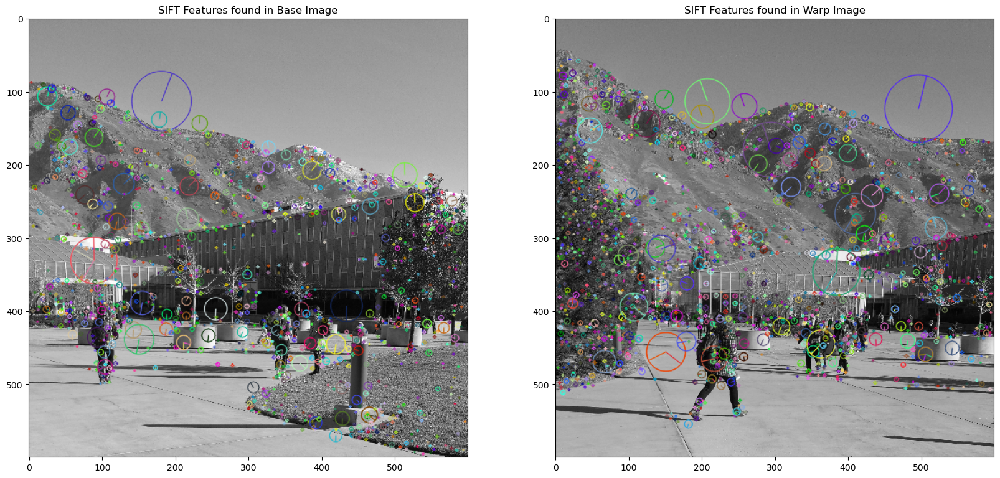

In [419]:
m1 = match_features_sift(base_image, imgs[0], show_features=True) # returns the best matches for this image pair

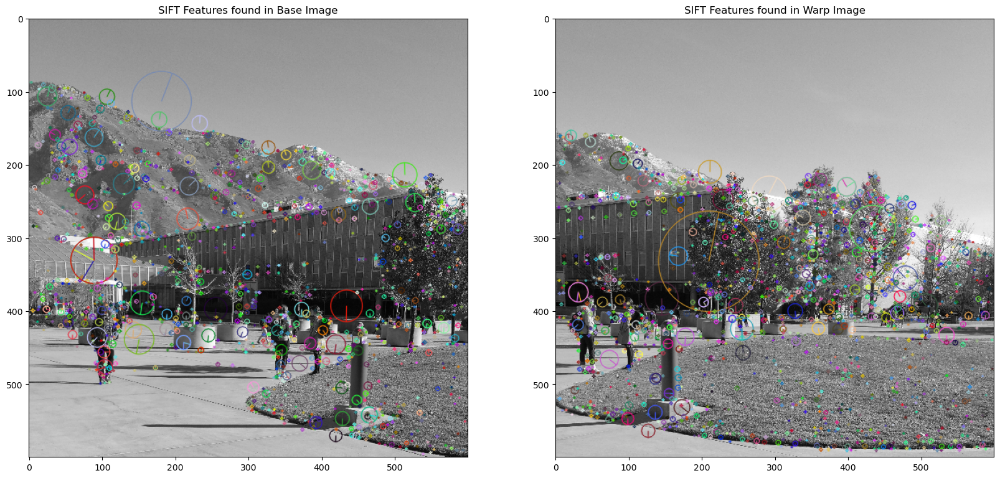

In [420]:
m2 = match_features_sift(base_image, imgs[1], show_features=True) # showing features found for the base image and second warp image

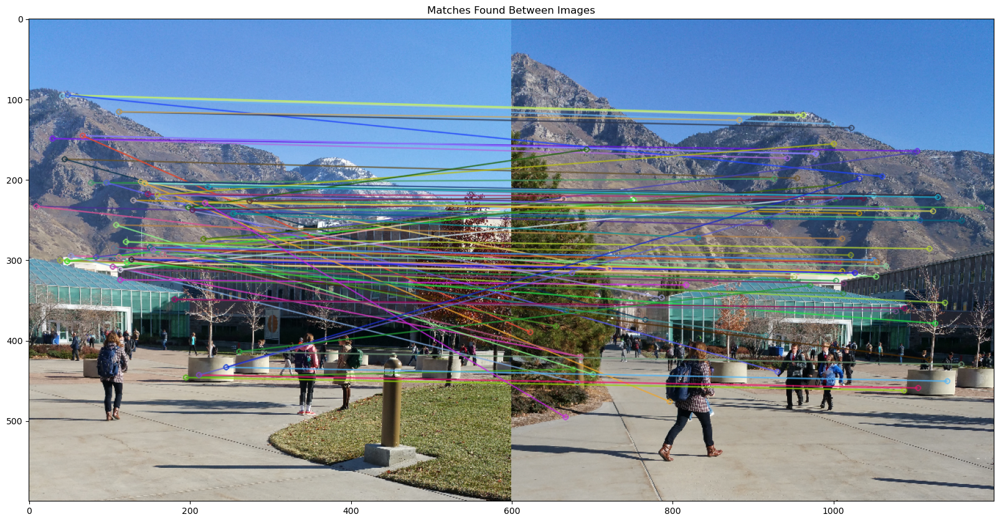

In [421]:
temp = match_features_sift(base_image, imgs[0], show_matches=True) # placed this code here to view the example matches 

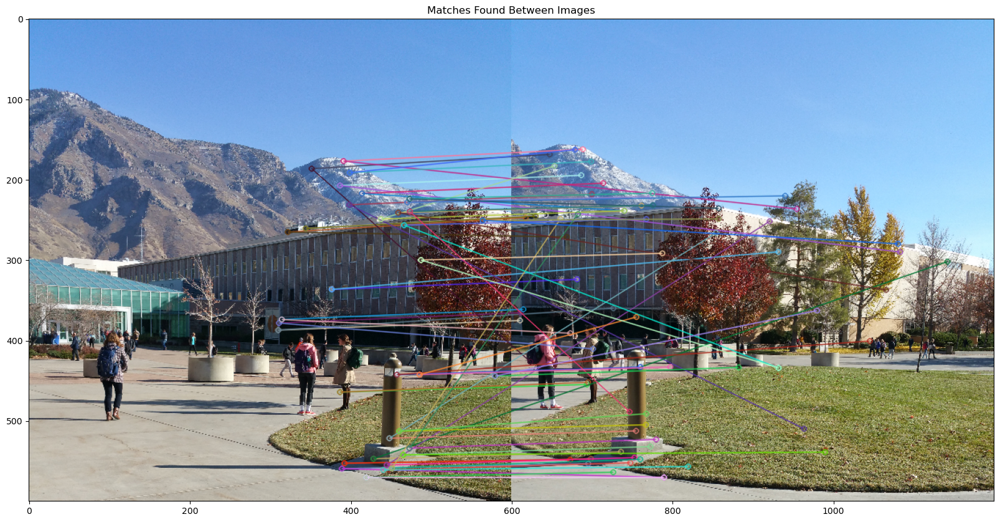

In [422]:
temp = match_features_sift(base_image, imgs[1], show_matches=True)

In [423]:
def compute_homography_ransac(match_points, inlier_threshold=5) -> np.array:  
    
    def homography(points):  
        X = []  
        Y = []  

        # the order here needed to be swapped since we are going from the warp image to the base image - base image points are x1, x2
        for (x2, y2), (x1, y1) in points: 
            X.append([x1, y1, 1, 0, 0, 0, -x2 * x1, -x2 * y1])  
            X.append([0, 0, 0, x1, y1, 1, -y2 * x1, -y2 * y1])  
            Y.append([x2])  
            Y.append([y2])  

        X = np.array(X)  
        Y = np.array(Y)  
  
        B = np.linalg.inv(X.T @ X) @ X.T @ Y  
        B = np.append(B, 1)  
        H = np.reshape(B, (3, 3))  
  
        return H  
  
    best_homography = None  
    max_inliers = 0  
  
    # implement the four point algorithm - drawing 4 random samples of points 
    for i in range(100):  
        rand_points = random.sample(match_points, 4)  
        H = homography(rand_points) # calculates the homogrpahy for the 4 points
  
        inliers = 0  
        for points in match_points:  
            (x1, y1), (x2, y2) = points # x1, y1 are for the base image
            source_points = np.array([x1, y1, 1])  
            destination_points = np.array([x2, y2, 1])  
            projected_points = H @ destination_points  
            projected_points /= projected_points[2] # divide by the homogenous point for scaling 
  
            error = np.linalg.norm(projected_points - source_points)  
            if error < inlier_threshold:  
                inliers += 1  

        # homography that produces the largest amount of inliers - one that reduces the error for the most points
        if inliers > max_inliers:  
            max_inliers = inliers  
            best_homography = H  
  
    return best_homography, max_inliers

In [424]:
H1, max_inliers1 = compute_homography_ransac(m1) # matches for first image pair - estimating homography using RANSAC
H2, max_inliers2 = compute_homography_ransac(m2) # matches for second image pair - estimating homography using RANSAC
print('Homography Matrix for First Image Pair: ')
print(H1)
print('\nHomography Matrix for Second Image Pair: ')
print(H2)

Homography Matrix for First Image Pair: 
[[ 1.24345943e+00  4.70958407e-02 -4.00744230e+02]
 [ 1.65852439e-01  1.15021894e+00 -8.81752945e+01]
 [ 4.29277508e-04 -7.28823921e-05  1.00000000e+00]]

Homography Matrix for Second Image Pair: 
[[ 7.97993522e-01  1.88757872e-02  3.07024827e+02]
 [-1.68040418e-01  1.00929172e+00  2.18990535e+01]
 [-3.89587579e-04  8.24041316e-05  1.00000000e+00]]


In [425]:
def mosaic(base, warp, homography) -> np.array:

    # images were resized to the shape, no need to get h&w for both
    h, w = base.shape[:2]  
    corners = np.array([[0,0], [0,h],[w,h],[w,0]]) 

    # translates the corner points of the image to the points that they would be on for the base image   
    warpped_corners = np.array([((homography @ np.append(corner,1))/(homography @ np.append(corner,1))[2])[:-1] for corner in corners])  

    corners = np.concatenate((corners, warpped_corners), axis=0)  
    xmin, ymin = np.int32(corners.min(axis=0).ravel())
    xmax, ymax = np.int32(corners.max(axis=0).ravel()) 

    # produces the dimensions of the final image that it returned   
    width = xmax - xmin    
    height = ymax - ymin   
    translation = np.float32([[1, 0, -xmin],  
                                [0, 1, -ymin],  
                                [0, 0, 1]])

    output_image = cv2.warpPerspective(warp, translation @ homography, (width, height))  
    output_image[-ymin:h-ymin, -xmin:w-xmin] = base  

    return output_image

In [426]:
# stitching first two image pairs and then getting homography between the two stitched images
warp1 = mosaic(base_image, imgs[0], H1)
warp2 = mosaic(base_image, imgs[1], H2)
m3 = match_features_sift(warp1, warp2)
H3, max_inliers3 = compute_homography_ransac(m3)
final = mosaic(warp1, warp2, H3)

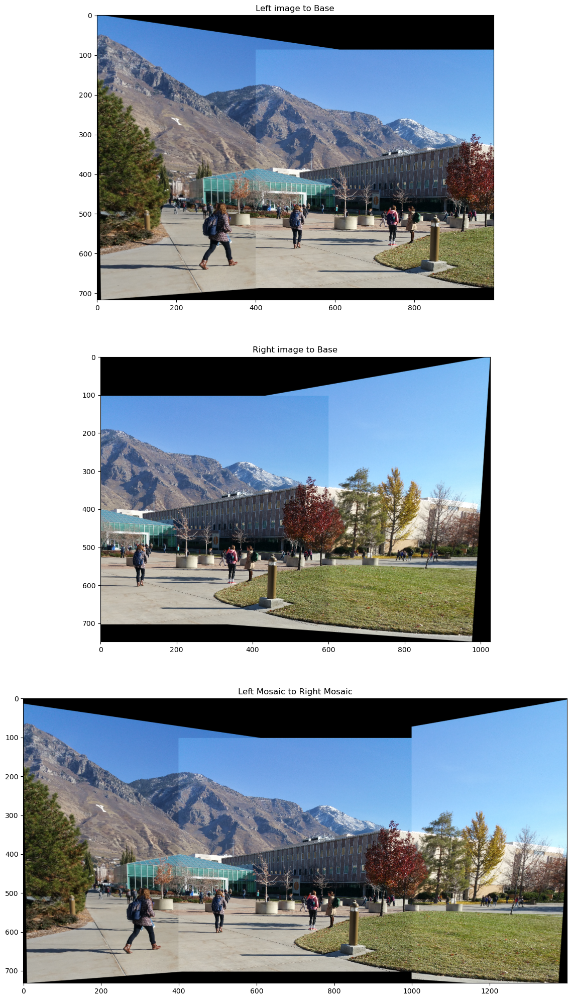

In [427]:
mosaics = [warp1, warp2, final]
titles = ['Left image to Base', 'Right image to Base', 'Left Mosaic to Right Mosaic']
fig, ax = plt.subplots(3,1,figsize=(25,25))
for index, img, title in zip(range(len(mosaics)), mosaics, titles):
    ax[index].imshow(img)
    ax[index].set_title(title)
plt.show()